In [1]:
import matplotlib.pyplot as plt
import tensorflow as tf
import tensorflow_compression as tfc
import tensorflow_datasets as tfds
import os
import numpy as np
tf.config.run_functions_eagerly(False)

os.environ["TF_FORCE_GPU_ALLOW_GROWTH"] = "true"
os.environ["TF_GPU_ALLOCATOR"] = "cuda_malloc_async"

from tensorflow.compat.v1 import ConfigProto
from tensorflow.compat.v1 import InteractiveSession
config = ConfigProto()
config.gpu_options.allow_growth = True
session = InteractiveSession(config=config)

2024-04-26 18:20:32.193163: I tensorflow/core/util/port.cc:111] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-04-26 18:20:32.238505: E tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:9342] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-04-26 18:20:32.238541: E tensorflow/compiler/xla/stream_executor/cuda/cuda_fft.cc:609] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-04-26 18:20:32.238568: E tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:1518] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-04-26 18:20:32.247117: I tensorflow/core/platform/cpu_feature_g

In [2]:
def make_analysis_transform(latent_dims):
  """Creates the analysis (encoder) transform."""
  return tf.keras.Sequential([
      tf.keras.layers.Conv2D(latent_dims, (7, 7), use_bias=True, activation=tfc.GDN(), padding='same'),
      tf.keras.layers.MaxPooling2D((4, 4), padding='same'),
      tf.keras.layers.Conv2D(latent_dims, (5, 5), use_bias=True, activation=tfc.GDN(), padding='same'),
      tf.keras.layers.MaxPooling2D((2, 2), padding='same'),
      tf.keras.layers.Conv2D(latent_dims, (5, 5), use_bias=False, activation=None, padding='same'),
      tf.keras.layers.MaxPooling2D((2, 2), padding='same'),
  ], name="analysis_transform")


In [3]:
def make_synthesis_transform(latent_dims):
  """Creates the synthesis (decoder) transform."""
  return tf.keras.Sequential([
      tf.keras.layers.UpSampling2D((2, 2)),
      tf.keras.layers.Conv2DTranspose(latent_dims, (5, 5), activation=tfc.GDN(), use_bias=True, padding='same'),
      tf.keras.layers.UpSampling2D((2, 2)),
      tf.keras.layers.Conv2DTranspose(latent_dims, (5, 5), activation=tfc.GDN(), use_bias=True, padding='same'),
      tf.keras.layers.UpSampling2D((4, 4)),
      tf.keras.layers.Conv2DTranspose(3, (5, 5), activation=None, use_bias=True, padding='same')
  ], name="synthesis_transform")


In [4]:
class ModelSaveCheckpoint(tf.keras.callbacks.Callback):
  def __init__(self, model, name):
    super(ModelSaveCheckpoint, self).__init__()
    self.model = model
    self.name = name

  def on_epoch_end(self, epoch, logs=None):
    if epoch % 5 == 0:
      self.model.save_weights("models/checkpoints/{}/{}_{}.h5".format(self.name, self.name, epoch))

In [5]:
class ModelSaveTrainHistory(tf.keras.callbacks.Callback):
  def __init__(self, name):
    super(ModelSaveTrainHistory, self).__init__()
    self.name = name
    self.history = {}

  def on_train_end(self, logs=None):
    self.history = logs
    with open("models/checkpoints/{}/{}_history.json".format(self.name, self.name), "w") as f:
      f.write(str(self.history))

In [6]:
class ModelSaveLossPlot(tf.keras.callbacks.Callback):
  def __init__(self, name):
    super(ModelSaveLossPlot, self).__init__()
    self.name = name
    self.losses = []

  def on_train_end(self, logs=None):
    plt.plot([x['rate_loss'] for x in self.losses], label='rate_loss')
    plt.plot([x['val_rate_loss'] for x in self.losses], label='val_rate_loss')
    plt.legend()
    plt.savefig("models/checkpoints/{}/{}_rate_loss.png".format(self.name, self.name))

    plt.close()

    plt.plot([x['distortion_loss'] for x in self.losses], label='distortion_loss')
    plt.plot([x['val_distortion_loss'] for x in self.losses], label='val_distortion_loss')
    plt.legend()
    plt.savefig("models/checkpoints/{}/{}_distortion_loss.png".format(self.name, self.name))

    plt.close()

    plt.plot([x['loss'] for x in self.losses], label='loss')
    plt.plot([x['val_loss'] for x in self.losses], label='val_loss')
    plt.legend()
    plt.savefig("models/checkpoints/{}/{}_loss.png".format(self.name, self.name))
    plt.close()

  def on_epoch_end(self, epoch, logs=None):
    self.losses += [logs]

In [5]:
class CompressionTrainer(tf.keras.Model):
  """Model that trains a compressor/decompressor for ."""

  def __init__(self, latent_dims, target_rate, target_distortion):
    super().__init__()
    self.analysis_transform = make_analysis_transform(latent_dims)
    self.synthesis_transform = make_synthesis_transform(latent_dims)
    self.prior = tfc.NoisyDeepFactorized(batch_shape=(latent_dims,))
    self.target_rate = target_rate
    self.target_distortion = target_distortion

  def call(self, x, training):
    """Computes rate and distortion losses."""
  
    # Compute latent space representation y, perturb it and model its entropy,
    # then compute the reconstructed pixel-level representation x_hat.
    y = self.analysis_transform(x)
    entropy_model = tfc.ContinuousBatchedEntropyModel(
        self.prior, coding_rank=3, compression=False)
    
    y_tilde, bits = entropy_model(y, training=training)
    x_tilde = self.synthesis_transform(y_tilde)

    num_pixels = tf.cast(tf.reduce_prod(tf.shape(x)[:-1]), bits.dtype)
    bpp = tf.reduce_sum(bits) / num_pixels

    rate = tf.abs(bpp - self.target_rate)

    distortion = tf.reduce_mean(tf.math.squared_difference(x, x_tilde))
  
    return dict(rate=rate, distortion=distortion)


In [6]:
training_dataset, validation_dataset = tfds.load(
    "imagenet_resized/64x64",
    split=["train[:50%]", "validation"],
    shuffle_files=True,
    as_supervised=True,
    with_info=False,
)

2024-04-26 18:20:36.705676: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:894] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-04-26 18:20:36.705958: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:894] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-04-26 18:20:36.706104: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:894] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

In [7]:
def pass_through_loss(_, x):
  # Since rate and distortion are unsupervised, the loss doesn't need a target.
  return x

def make__compression_trainer(target_rate, target_distortion, lmbda,  latent_dims=256):
  trainer = CompressionTrainer(latent_dims, target_rate, target_distortion)
  
  trainer.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
    # Just pass through rate and distortion as losses/metrics.
    loss=dict(rate=pass_through_loss, distortion=pass_through_loss),
    loss_weights=dict(rate=1., distortion=lmbda)
  )
  return trainer

In [8]:
def add_rd_targets(image, label):
  # Training is unsupervised, so labels aren't necessary here. However, we
  # need to add "dummy" targets for rate and distortion.
  return image, dict(rate=0.075, distortion=0.)

def preprocess(image, label):
  image = tf.cast(image, tf.float32) / 255.
  image = tf.image.rgb_to_yuv(image)
  return image, label


In [11]:
os.makedirs("models/checkpoints/end-to-end-big", exist_ok=True)

In [ ]:
def train__model(lmbda, target_rate, target_distortion):
  trainer = make__compression_trainer(target_rate, target_distortion, lmbda)
  trainer.build((None, 64, 64,  3))
  trainer.summary()

  scheduler = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=4, min_lr=1e-7, min_delta=0.1)

  history = trainer.fit(
      training_dataset.map(preprocess).map(add_rd_targets).batch(256).prefetch(16),
      epochs=50,
      verbose=2,
      use_multiprocessing=True,
      workers=4,
      callbacks=[
          ModelSaveCheckpoint(trainer, "end-to-end-big"),
          ModelSaveTrainHistory("end-to-end-big"),
          ModelSaveLossPlot("end-to-end-big"),
          scheduler
      ],
      validation_data=validation_dataset.map(preprocess).map(add_rd_targets).batch(256).prefetch(16),
  )
  
  return trainer, history

trainer, history = train__model(lmbda=3000, target_rate=0.075, target_distortion=0)

2024-04-25 22:10:53.701332: I tensorflow/tsl/platform/default/subprocess.cc:304] Start cannot spawn child process: No such file or directory


Model: "compression_trainer"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 analysis_transform (Sequen  (None, 4, 4, 256)         3446528   
 tial)                                                           
                                                                 
 synthesis_transform (Seque  (None, 64, 64, 3)         3428099   
 ntial)                                                          
                                                                 
Total params: 6881795 (26.25 MB)
Trainable params: 6881795 (26.25 MB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Epoch 1/50


2024-04-25 22:11:03.532512: I tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:442] Loaded cuDNN version 8904
2024-04-25 22:11:03.785133: I tensorflow/tsl/platform/default/subprocess.cc:304] Start cannot spawn child process: No such file or directory
2024-04-25 22:11:09.201242: I tensorflow/compiler/xla/service/service.cc:168] XLA service 0x7ef8b1f97df0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2024-04-25 22:11:09.201284: I tensorflow/compiler/xla/service/service.cc:176]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
2024-04-25 22:11:09.206846: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2024-04-25 22:11:09.310540: I ./tensorflow/compiler/jit/device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.
2024-04-25 22:11:14.144757: W tensorflow/tsl/fram

2503/2503 - 1354s - loss: 8.6274 - distortion_loss: 0.0024 - rate_loss: 1.3170 - val_loss: 6.6532 - val_distortion_loss: 0.0019 - val_rate_loss: 0.9738 - lr: 1.0000e-04 - 1354s/epoch - 541ms/step
Epoch 27/50


In [14]:
# trainer.save_weights("models/end-to-end-big.h5")
trainer.save("models/end-to-end-big")

ValueError: Model <__main__.CompressionTrainer object at 0x7f1220211060> cannot be saved either because the input shape is not available or because the forward pass of the model is not defined.To define a forward pass, please override `Model.call()`. To specify an input shape, either call `build(input_shape)` directly, or call the model on actual data using `Model()`, `Model.fit()`, or `Model.predict()`. If you have a custom training step, please make sure to invoke the forward pass in train step through `Model.__call__`, i.e. `model(inputs)`, as opposed to `model.call()`.

In [9]:
trainer = make__compression_trainer(lmbda=3000, target_rate=0.075, target_distortion=0)
# # # Load the weights of the trained model.
trainer.build((None, None, None, 3))
trainer.load_weights("models/end-to-end-big.h5")
# trainer = tf.keras.models.load_model("models/end-to-end-big/", compile=False)

2024-04-26 18:20:47.420091: I tensorflow/tsl/platform/default/subprocess.cc:304] Start cannot spawn child process: No such file or directory


In [10]:
class Compressor(tf.keras.Model):
  """Compresses  images to strings."""

  def __init__(self, analysis_transform, entropy_model):
    super().__init__()
    self.analysis_transform = analysis_transform
    self.entropy_model = entropy_model

  def call(self, x):
    # Ensure inputs are floats in the range (0, 1).
    y = self.analysis_transform(x)
    # Also return the exact information content of each digit.
    _, bits = self.entropy_model(y, training=False)
    return self.entropy_model.compress(y), bits

In [11]:
class Decompressor(tf.keras.Model):
  """Decompresses  images from strings."""

  def __init__(self, entropy_model, synthesis_transform):
    super().__init__()
    self.entropy_model = entropy_model
    self.synthesis_transform = synthesis_transform

  def call(self, string):
    y_hat = self.entropy_model.decompress(string, (),)
    x_hat = self.synthesis_transform(y_hat)
    # Scale and cast back to 8-bit integer.
    return x_hat


In [12]:
def make_codec(trainer, **kwargs):
  # The entropy model must be created with `compression=True` and the same
  # instance must be shared between compressor and decompressor.
  entropy_model = tfc.ContinuousBatchedEntropyModel(
      trainer.prior, coding_rank=1, compression=True, **kwargs)
  compressor = Compressor(trainer.analysis_transform, entropy_model)
  decompressor = Decompressor(entropy_model, trainer.synthesis_transform)
  return compressor, decompressor

compressor, decompressor = make_codec(trainer, decode_sanity_check=False)


In [13]:
(originals, _), = validation_dataset.batch(1).take(1)
originals, _ = preprocess(originals, None)

In [14]:
strings, entropies = compressor(originals)

2024-04-26 18:21:14.149915: I tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:442] Loaded cuDNN version 8904
2024-04-26 18:21:14.265084: I tensorflow/tsl/platform/default/subprocess.cc:304] Start cannot spawn child process: No such file or directory


In [15]:
reconstructions = decompressor(strings)
reconstructions = tf.image.yuv_to_rgb(reconstructions)
reconstructions = tf.cast(reconstructions * 255, tf.uint8)

In [16]:
originals = tf.image.yuv_to_rgb(originals)
originals = tf.saturate_cast(originals * 255., tf.uint8)

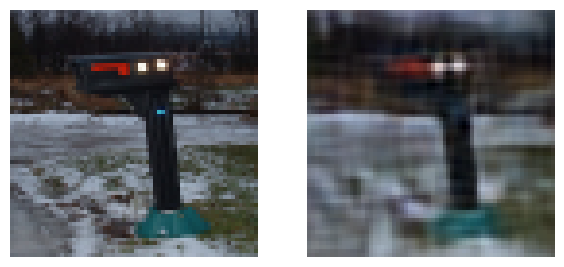

In [17]:
# Display the original and reconstructed images.
plt.figure(figsize=(30, 30))
for i, (original, reconstruction) in enumerate(zip(originals, reconstructions)):
  plt.subplot(4, 8, 2 * i + 1)
  plt.imshow(tf.squeeze(original))
  plt.axis("off")
  plt.subplot(4, 8, 2 * i + 2)
  plt.imshow(tf.squeeze(reconstruction))
  plt.axis("off")

In [19]:
tf.image.ssim(originals, reconstruction, max_val=255)

<tf.Tensor: shape=(1,), dtype=float32, numpy=array([0.74389106], dtype=float32)>

In [20]:
def pad_image(image: np.ndarray, patch_size: int):
 
    h, w, c = image.shape
    h_pad = (patch_size - (h % patch_size)) % patch_size
    w_pad = (patch_size - (w % patch_size)) % patch_size

    return np.pad(image, ((0, h_pad), (0, w_pad), (0, 0)), mode='edge'), h_pad, w_pad

In [21]:
def compress_image(image: np.ndarray, compressor, decompressor) -> tuple[np.ndarray, np.ndarray]:
    patch_size = 64

    # pad the image
    image, h_pad, w_pad = pad_image(image, patch_size)
    
    height, width, channels = image.shape
    no_patches_width = width // patch_size
    no_patches_height = height // patch_size
    
    # transform image to list with a single element
    image = tf.expand_dims(image, axis=0)

    image = tf.image.extract_patches(image, sizes=[1, patch_size, patch_size, 1], strides=[1, patch_size, patch_size, 1], rates=[1, 1, 1, 1], padding='VALID')
    image = tf.reshape(image, [-1, patch_size,patch_size,3])
    image = tf.image.rgb_to_yuv(image)

    strings, entropies = compressor(image)
    # strings = [string.numpy() for string in strings]

    reconstructed_patches = decompressor(strings)
    
    reconstructed_image = np.zeros((height, width, channels))

    for i in range(no_patches_height):
        for j in range(no_patches_width):
            patch = reconstructed_patches[i*no_patches_width+j].numpy()
            # print(i*patch_size, (i+1)*patch_size, j*patch_size, (j+1)*patch_size)
            reconstructed_image[i*patch_size:(i+1)*patch_size, j*patch_size:(j+1)*patch_size] = patch

    height = height - h_pad
    width = width - w_pad

    reconstructed_image = reconstructed_image[:height, :width]

    # convert reconstructed image to tensor
    reconstructed_image = tf.convert_to_tensor(reconstructed_image)
    reconstructed_image = tf.image.yuv_to_rgb(reconstructed_image)
    reconstructed_image = tf.saturate_cast(reconstructed_image * 255, tf.uint8)
    
    return reconstructed_image, strings, entropies

In [22]:
image = tf.image.decode_image(tf.io.read_file('data/ciob.png'), channels=3, dtype='float32')

image_copy = image

result, strings, entropies = compress_image(image_copy, compressor, decompressor)

image = tf.saturate_cast(image * 255, tf.uint8)

In [23]:
print(strings.shape)
strings = strings.numpy()
strings = np.reshape(strings, (-1, np.prod(strings.shape)))
print(strings.shape)
strings = np.squeeze(strings)

(56, 4, 4)
(1, 896)


In [24]:
print(len(strings[1]))

173


(467, 396, 3)
(467, 396, 3)


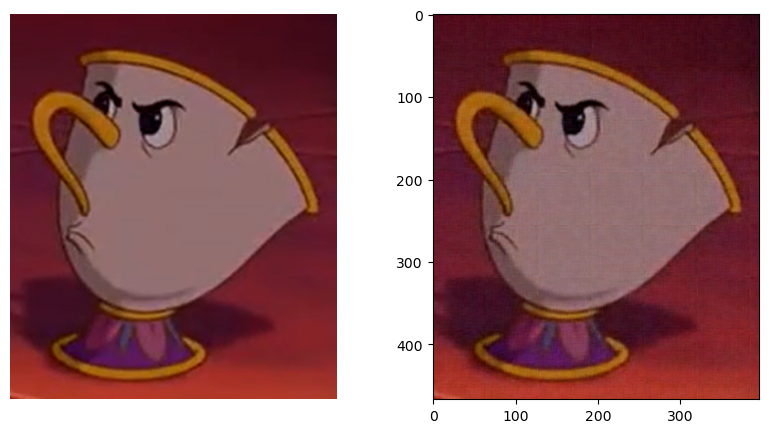

In [25]:
# plot both images
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(tf.squeeze(image))
plt.axis("off")
plt.subplot(1, 2, 2)
plt.imshow(tf.squeeze(result))
print(result.shape)
print(image.shape)

In [26]:
tf.image.ssim(image, result, max_val=255)

<tf.Tensor: shape=(), dtype=float32, numpy=0.9144769>

In [27]:
tf.image.ssim_multiscale(image, result, max_val=255)

<tf.Tensor: shape=(), dtype=float32, numpy=0.9646328>

In [28]:
tf.image.psnr(image, result, max_val=255)

<tf.Tensor: shape=(), dtype=float32, numpy=36.298054>

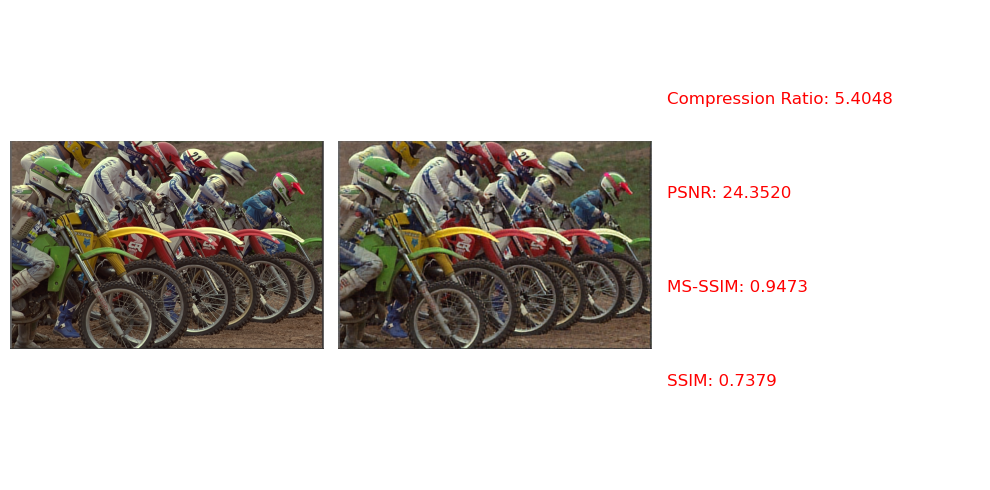

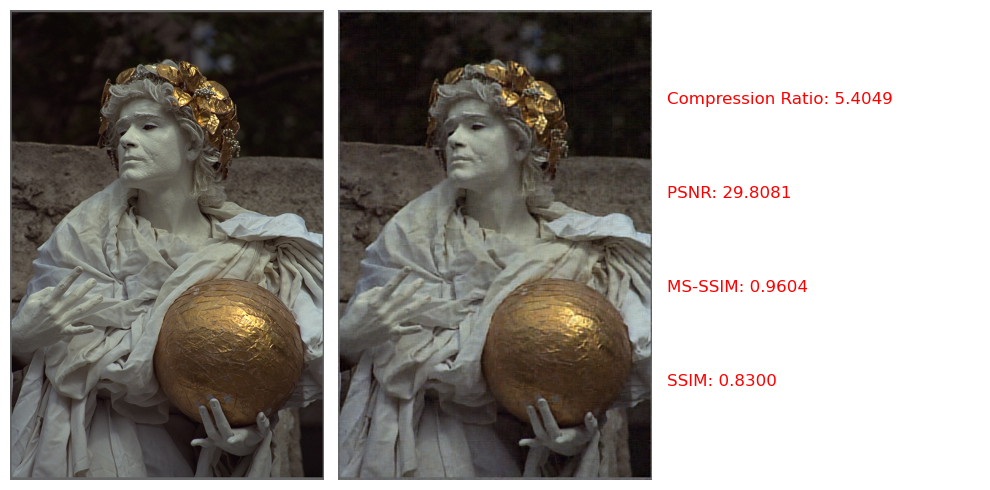

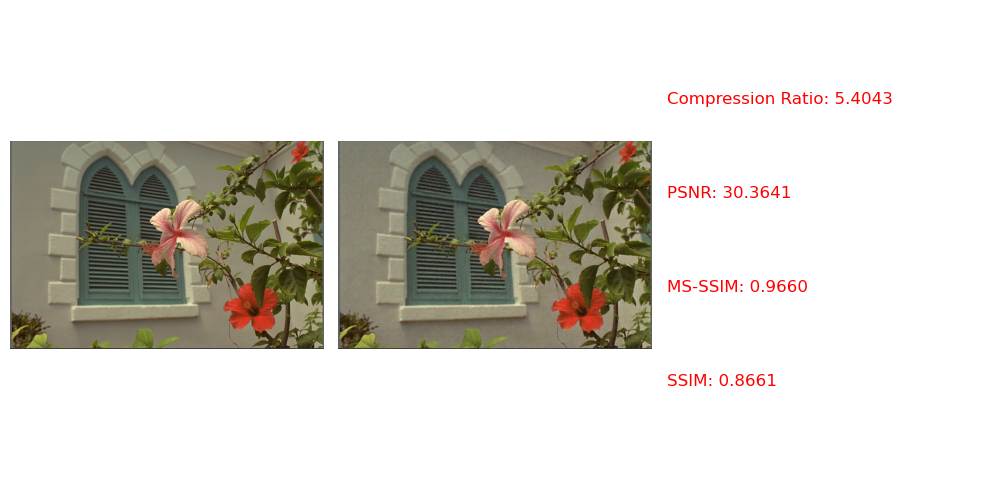

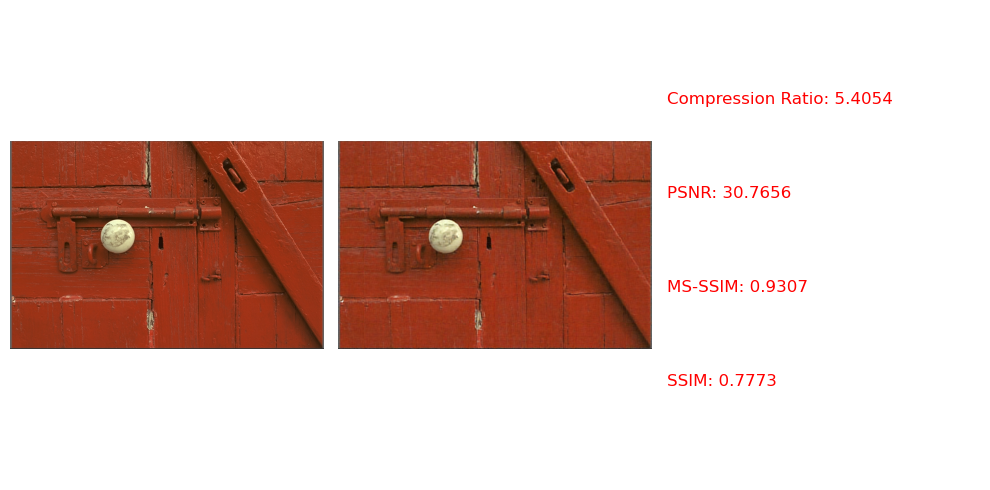

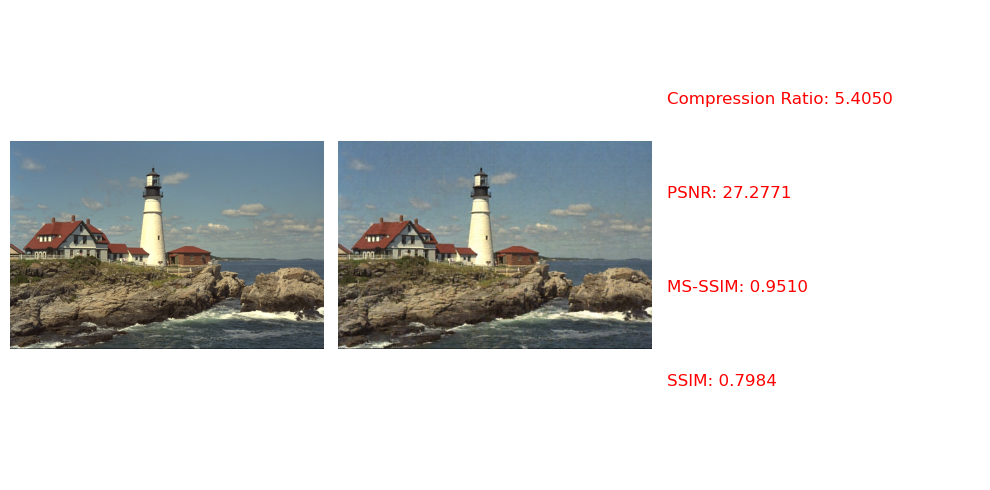

...

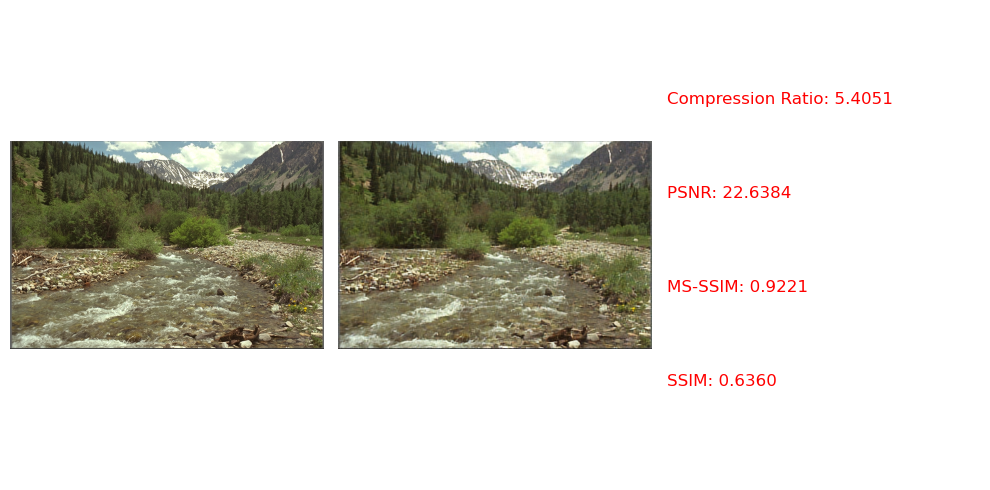

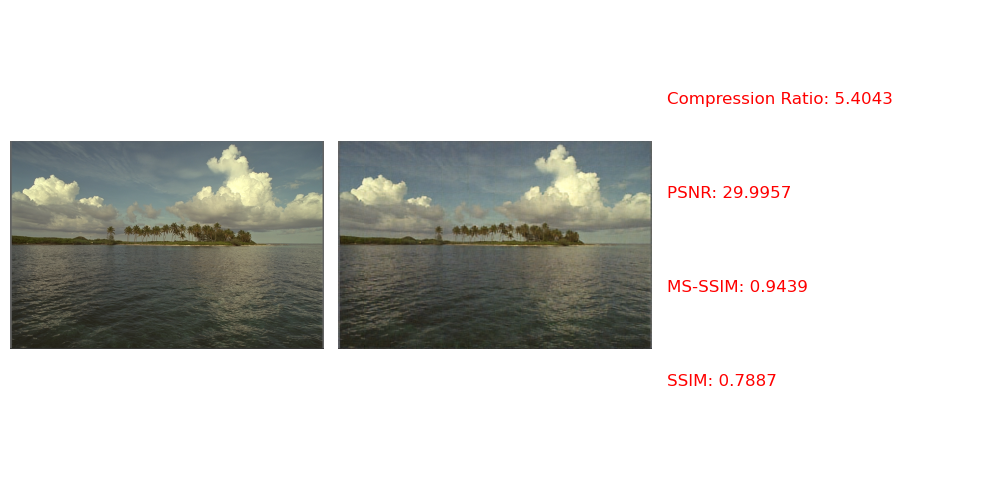

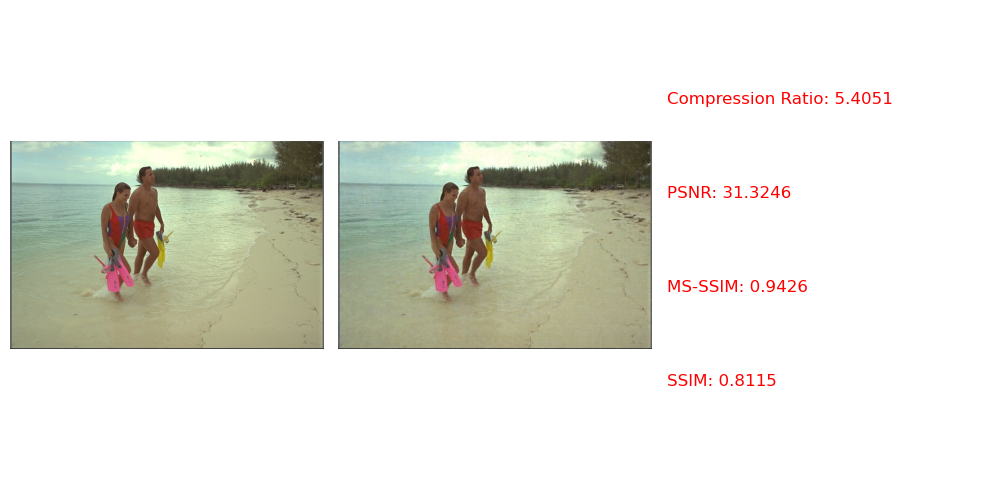

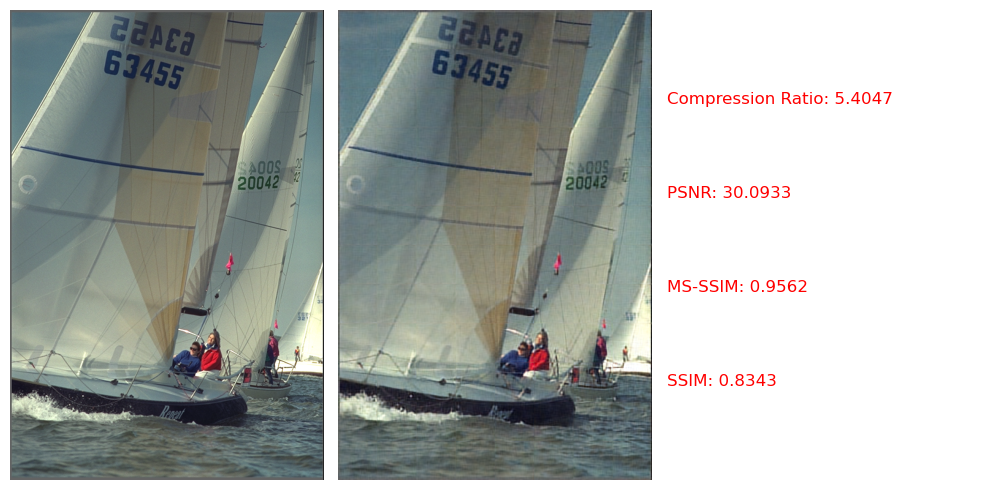

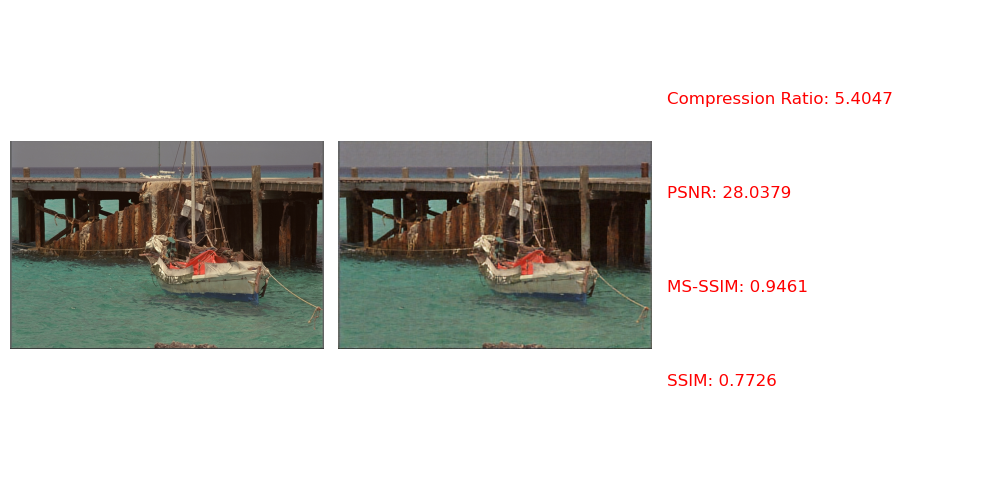

Average SSIM: 0.7852
Average MS-SSIM: 0.9466
Average PSNR: 28.3087


In [29]:
benchmark_directory = "data/benchmark/"
benchmark_images = tf.io.gfile.glob(benchmark_directory + "*.png")

psnrs = []
ssims = []
ms_ssims = []

for image_path in benchmark_images:
    image = tf.image.decode_image(tf.io.read_file(image_path), channels=3, dtype='float32')
    image_copy = image
    result, strings, entropies = compress_image(image_copy, compressor, decompressor)
    
    # flatten the strings
    strings = np.reshape(strings, np.prod(strings.shape))
    strings = np.squeeze(strings)
    
    # calculate the size of the compressed image
    pixels = tf.cast(tf.reduce_prod(tf.shape(image)[-3:-1]), tf.float32)
    bits = sum([len(s) * 8 for s in strings])

    # calculate the compression ratio
    compression_ratio = bits / pixels

    image = tf.saturate_cast(image * 255, tf.uint8)
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 3, 1)
    plt.imshow(tf.squeeze(image))
    plt.axis("off")

    plt.subplot(1, 3, 2)
    plt.imshow(tf.squeeze(result))
    plt.axis("off")

    ssim = tf.image.ssim(tf.squeeze(image), tf.squeeze(result), max_val=255)
    ms_ssim = tf.image.ssim_multiscale(tf.squeeze(image), tf.squeeze(result), max_val=255)
    psnr = tf.image.psnr(tf.squeeze(image), tf.squeeze(result), max_val=255)

    # show ssim, ms-ssim and psnr on the plot
    plt.subplot(1, 3, 3)
    plt.text(0, 0.2, f"SSIM: {ssim.numpy():.4f}", fontsize=12, color='red')
    plt.text(0, 0.4, f"MS-SSIM: {ms_ssim.numpy():.4f}", fontsize=12, color='red')
    plt.text(0, 0.6, f"PSNR: {psnr.numpy():.4f}", fontsize=12, color='red')
    plt.text(0, 0.8, f"Compression Ratio: {compression_ratio.numpy():.4f}", fontsize=12, color='red')
    plt.axis("off")
    # center the text vertically
    plt.tight_layout()

    ssims.append(ssim)
    ms_ssims.append(ms_ssim)
    psnrs.append(psnr)

    plt.show()

print(f"Average SSIM: {np.mean(ssims):.4f}")
print(f"Average MS-SSIM: {np.mean(ms_ssims):.4f}")
print(f"Average PSNR: {np.mean(psnrs):.4f}")